# Topic Modelling NLP

## Table of Contents

1. Import Libraries
2. TFIDF - Normal Cleaning
    - Preprocessing (Building Corpus and Dictionary)
    - LSI Model
      - Save LSI Topics to Dataframe
    - LDA Model
      - Save LDA Topics to Dataframe
3. TFIDF - Frequency Filters
    - Preprocessing (Building Corpus and Dictionary)
    - LSI Model
      - Save LSI Topics to Dataframe
    - LDA Model
      - Save LDA Topics to Dataframe
4. TFIDF - Nouns
    - Preprocessing (Building Corpus and Dictionary)
    - LSI Model
      - Save LSI Topics to Dataframe
    - LDA Model
      - Save LDA Topics to Dataframe
5. Export Dataframe to CSV

In [1]:
# Import libraries

# Usual libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time
import re
import string
import random

# NLTK
import nltk
from nltk.tokenize import regexp_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# Assigning variables
lemmatizer = nltk.stem.WordNetLemmatizer()
w_tokenizer = nltk.tokenize.WhitespaceTokenizer()
stop_words = stopwords.words('english')

# Scikit-learn
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import f1_score, recall_score, precision_score, confusion_matrix, classification_report
from sklearn.model_selection import cross_val_score
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer

# Models
from sklearn.linear_model import LogisticRegression
import xgboost as xgb
import lightgbm as gbm
from lightgbm import LGBMClassifier
from sklearn.neighbors import KNeighborsClassifier

# Doc/Word Vectors
from gensim.models.fasttext import FastText
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from gensim.models import Word2Vec
from gensim.utils import simple_preprocess
from gensim.corpora import Dictionary

# LDA and LSI Models
from sklearn.decomposition import LatentDirichletAllocation as LDA
from gensim.models import LsiModel, CoherenceModel
from gensim.models import TfidfModel
from gensim.models import LdaModel, LdaMulticore
from gensim import corpora, models
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()

# Spacy
import spacy
from spacy.lang.en.examples import sentences
from spacy import displacy
nlp = spacy.load("en_core_web_sm")
stopwords_nlp = nlp.Defaults.stop_words

# LIME and SHAP
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer
import shap

# Set seed
np.random.seed(123)

In [2]:
# Import dataset
df = pd.read_csv(r'C:\Users\Scott\Box\Shyam\01_Shyam_Personal\Text Mining\BBC-articles.csv')
df.head()

,category,text
0,tech,tv future in the hands of viewers with home th...
1,business,worldcom boss left books alone former worldc...
2,sport,tigers wary of farrell gamble leicester say ...
3,sport,yeading face newcastle in fa cup premiership s...
4,entertainment,ocean s twelve raids box office ocean s twelve...


In [3]:
# Check for null values

df.isna().sum()

category    0
text        0
dtype: int64

## TFIDF Normal Cleaning

### Preprocessing

In [4]:
# Loop through the column and clean the data

new_text = []

for text in df['text']:
    text = re.sub(r'[!"#$%&()*+,-./:;<=>?[\]^_`{|}~]', ' ', text).lower()               # Remove punctuation and make the letters lowercase
        
    words = nltk.tokenize.word_tokenize(text)                                           # Tokenize the text
    words = [w for w in words if w.isalpha()]                                           # Ensure the data is alphabets (remove numbers)
    words = [w for w in words if len(w)>1 and w not in stopwords.words('english')]      # Remove words that are less than 2 characters and stop words as well
        
    words = [lemmatizer.lemmatize(w) for w in words]                                    # Lemmatize the words
    new_text.append(' '.join(words))

# Make a copy of the original dataframe and add the cleaned text into a new column
tfidf_df = df.copy()
tfidf_df['new_text'] = new_text
tfidf_df

,category,text,new_text
0,tech,tv future in the hands of viewers with home th...,tv future hand viewer home theatre system plas...
1,business,worldcom boss left books alone former worldc...,worldcom bos left book alone former worldcom b...
2,sport,tigers wary of farrell gamble leicester say ...,tiger wary farrell gamble leicester say rushed...
3,sport,yeading face newcastle in fa cup premiership s...,yeading face newcastle fa cup premiership side...
4,entertainment,ocean s twelve raids box office ocean s twelve...,ocean twelve raid box office ocean twelve crim...
...,...,...,...
2220,business,cars pull down us retail figures us retail sal...,car pull u retail figure u retail sale fell ja...
2221,politics,kilroy unveils immigration policy ex-chatshow ...,kilroy unveils immigration policy ex chatshow ...
2222,entertainment,rem announce new glasgow concert us band rem h...,rem announce new glasgow concert u band rem an...
2223,politics,how political squabbles snowball it s become c...,political squabble snowball become commonplace...


In [5]:
# Define which input data to use in the normal cleaning TFIDF
input_data = tfidf_df['new_text']


In [6]:
# TFIDF Normal Model
# Create Vectorizor and Transform
tfidf_normal_vect = TfidfVectorizer(strip_accents='ascii', stop_words='english', lowercase= True, analyzer='word', binary=True)
tfidf_normal = tfidf_normal_vect.fit_transform(input_data)
tfidf_normal.shape 

(2225, 24502)

In [7]:
# print(tfidf_normal_vect.vocabulary_)
# print(sorted(tfidf_normal_vect.vocabulary_.keys()))

In [8]:
# Breaking down text into words

tfidf_normal_tokens = []
for i in input_data:
    words = i.split()
    tfidf_normal_tokens.append(words)

In [9]:
tfidf_normal_tokens

[['tv',
  'future',
  'hand',
  'viewer',
  'home',
  'theatre',
  'system',
  'plasma',
  'high',
  'definition',
  'tv',
  'digital',
  'video',
  'recorder',
  'moving',
  'living',
  'room',
  'way',
  'people',
  'watch',
  'tv',
  'radically',
  'different',
  'five',
  'year',
  'time',
  'according',
  'expert',
  'panel',
  'gathered',
  'annual',
  'consumer',
  'electronics',
  'show',
  'la',
  'vega',
  'discus',
  'new',
  'technology',
  'impact',
  'one',
  'favourite',
  'pastime',
  'u',
  'leading',
  'trend',
  'programme',
  'content',
  'delivered',
  'viewer',
  'via',
  'home',
  'network',
  'cable',
  'satellite',
  'telecom',
  'company',
  'broadband',
  'service',
  'provider',
  'front',
  'room',
  'portable',
  'device',
  'one',
  'talked',
  'technology',
  'ce',
  'digital',
  'personal',
  'video',
  'recorder',
  'dvr',
  'pvr',
  'set',
  'top',
  'box',
  'like',
  'u',
  'tivo',
  'uk',
  'sky',
  'system',
  'allow',
  'people',
  'record',
  's

In [10]:
# Create a dictionary from the tokens
tfidf_normal_dictionary = Dictionary(tfidf_normal_tokens)  

print(tfidf_normal_dictionary)
print('Dictionary Length: ', len(tfidf_normal_dictionary.token2id))

Dictionary<24698 unique tokens: ['abiding', 'according', 'adam', 'added', 'advert']...>
Dictionary Length:  24698


### LSI Model - TFIDF Normal Cleaning

In [11]:
# Building the corpus and the LSI Model

tfidf_normal_dtm = [tfidf_normal_dictionary.doc2bow(doc) for doc in tfidf_normal_tokens]
tfidf_normal_lsi_model = LsiModel(corpus=tfidf_normal_dtm, id2word=tfidf_normal_dictionary, num_topics=5)
tfidf_normal_lsi_model.print_topics(num_topics=5, num_words=5)

[(0,
  '0.482*"said" + 0.251*"mr" + 0.204*"year" + 0.194*"would" + 0.180*"people"'),
 (1,
  '-0.383*"mr" + -0.272*"said" + 0.257*"best" + 0.228*"music" + 0.215*"year"'),
 (2,
  '0.340*"best" + 0.286*"song" + 0.244*"mr" + -0.214*"game" + -0.185*"mobile"'),
 (3,
  '-0.494*"game" + 0.272*"music" + 0.198*"said" + 0.141*"song" + -0.140*"time"'),
 (4,
  '-0.363*"said" + 0.294*"people" + 0.245*"music" + -0.207*"year" + 0.198*"mr"')]

In [12]:
# Determining optimum number of topics using coherence values 

coherence_values_normal = []
lsi_model_list_normal = []
min_topics, max_topics, step = 1, 6, 1
for i in range(min_topics, max_topics, step):
    lsi_model = LsiModel(tfidf_normal_dtm, id2word=tfidf_normal_dictionary, num_topics=i)
    lsi_model_list_normal.append(lsi_model)
    coherencemodel = CoherenceModel(model=lsi_model, texts=tfidf_normal_tokens, dictionary=tfidf_normal_dictionary, coherence='c_v')
    coherence_values_normal.append(coherencemodel.get_coherence())

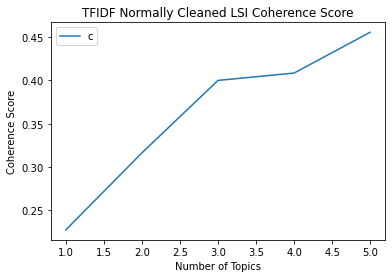

In [13]:
# Plot the coherence values

x = range(min_topics, max_topics, step)
plt.plot(x, coherence_values_normal)
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.legend(('coherence_values'), loc='best')
plt.title('TFIDF Normally Cleaned LSI Coherence Score')
plt.show()

When normally cleaned using TFIDF, topic 4 is the best topic with the LSI Model

#### LSI Normal Dataframe Input

In [14]:
# Use the tokened words and convert them into an array data type
tfidf_normal_tokens_array = np.array(tfidf_normal_tokens, dtype=object)

In [15]:
# Reshape the tokens list in the array to 3-Dimensional. This needs to be done for the doc2bow

tfidf_normal_3d = []                                    # Create list
for i, row in enumerate(tfidf_normal_tokens_array):     # Enumerate through each token list
    tok_arr = np.array(row)                             # Convert the tokens into array

    converted_arr = []                                  # Create another list
    for x in tok_arr:
        tok_arr.reshape((len(tok_arr),1,1))             # Reshape the array into 3-Dimensional
        converted_arr.append(tok_arr)                   # Append append to second list
    tfidf_normal_3d.append(converted_arr)               # Append second list to first list

tfidf_df['normal_3d_tokens'] = tfidf_normal_3d          # Add the 3-D tokens to the dataframe
tfidf_df.head(2)

,category,text,new_text,normal_3d_tokens
0,tech,tv future in the hands of viewers with home th...,tv future hand viewer home theatre system plas...,"[[tv, future, hand, viewer, home, theatre, sys..."
1,business,worldcom boss left books alone former worldc...,worldcom bos left book alone former worldcom b...,"[[worldcom, bos, left, book, alone, former, wo..."


In [16]:
# Creating an LSI Model and extracting the top 5 topics for each row

top_topics = []                                                                     # Create a list
for i, row in tfidf_df.iterrows():                                                  # Iterate through each row
    row_list = row['normal_3d_tokens']                                              # Iterate through the tokens column
    row_dictionary = Dictionary(row_list)                                           # Convert each row of tokens into its own dictionary (this will have one dictionary per row)
    row_dtm = [row_dictionary.doc2bow(doc) for doc in row_list]                     # Create the corpus for each row

    for this, that in enumerate([row_dtm]):                                         # Enumerate through each corpus
        row_model = LsiModel(corpus=that, id2word=row_dictionary, num_topics=5)     # Create the LSI Model
        top_topics.append(row_model.print_topics(num_topics=5, num_words=5))        # Get the top 5 topics and words for each row and append to the list

tfidf_df['top5_normal_lsi_topics'] = top_topics                                     # Inert the top 5 topics and words into the dataframe
tfidf_df.head(2)

,category,text,new_text,normal_3d_tokens,top5_normal_lsi_topics
0,tech,tv future in the hands of viewers with home th...,tv future hand viewer home theatre system plas...,"[[tv, future, hand, viewer, home, theatre, sys...","[(0, -0.441*""tv"" + -0.206*""people"" + -0.206*""w..."
1,business,worldcom boss left books alone former worldc...,worldcom bos left book alone former worldcom b...,"[[worldcom, bos, left, book, alone, former, wo...","[(0, -0.526*""mr"" + -0.351*""worldcom"" + -0.307*..."


### LDA Model - TFIDF Normal Cleaning

In [17]:
# Create TF-IDF Model

tfidf_normalvectorizer_lda = TfidfModel(tfidf_normal_dtm)
tfidf_normal_lda = tfidf_normalvectorizer_lda[tfidf_normal_dtm]

In [18]:
# Building LDA Model
lda_model_normal = LdaModel(tfidf_normal_lda, num_topics=5, id2word=tfidf_normal_dictionary, passes=5)
lda_model_normal.print_topics(num_topics=5, num_words=5)

[(0, '0.002*"mr" + 0.001*"u" + 0.001*"mobile" + 0.001*"blair" + 0.001*"game"'),
 (1,
  '0.002*"award" + 0.002*"film" + 0.002*"nomination" + 0.001*"oscar" + 0.001*"best"'),
 (2,
  '0.002*"holmes" + 0.001*"woodward" + 0.001*"dallaglio" + 0.001*"cup" + 0.001*"italy"'),
 (3,
  '0.001*"conte" + 0.001*"casino" + 0.001*"leary" + 0.001*"miliband" + 0.001*"mirza"'),
 (4,
  '0.001*"uwb" + 0.001*"cantona" + 0.001*"carrey" + 0.001*"mask" + 0.001*"livingstone"')]

In [19]:
# Getting the coherence score of the main model
lda_model_normal_coh = CoherenceModel(model=lda_model_normal, corpus=tfidf_normal_dtm, dictionary=tfidf_normal_dictionary, coherence='u_mass')
lda_model_normal_coh.get_coherence()

-11.824337296731436

#### Experimenting with different LDA Models

In [20]:
# Creating a good LDA model for comparison 

normal_good_lda_model = LdaModel(corpus=tfidf_normal_dtm, id2word=tfidf_normal_dictionary, iterations=50, num_topics=5)
normal_good_cm = CoherenceModel(model=normal_good_lda_model, corpus=tfidf_normal_dtm, dictionary=tfidf_normal_dictionary, coherence='u_mass')

normal_good_cm.get_coherence()

-1.4122746738857967

In [21]:
# Creating a bad LDA model for comparison

normal_bad_lda_model = LdaModel(corpus=tfidf_normal_dtm, id2word=tfidf_normal_dictionary, iterations=1, num_topics=5)
normal_bad_cm = CoherenceModel(model=normal_bad_lda_model, corpus=tfidf_normal_dtm, dictionary=tfidf_normal_dictionary, coherence='u_mass')

normal_bad_cm.get_coherence()

-1.1441294318102078

In [22]:
# VIsualize the topics in an interactive chart

vis_normal = gensimvis.prepare(normal_good_lda_model, tfidf_normal_lda, tfidf_normal_dictionary)
pyLDAvis.display(vis_normal)

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only


#### LDA Normal Dataframe Input

In [23]:
# Creating an LSI Model and extracting the top 5 topics for each row 
top_topics = []
for i, row in tfidf_df.iterrows():
    row_list = row['normal_3d_tokens']
    row_dictionary = Dictionary(row_list)
    row_dtm = [row_dictionary.doc2bow(doc) for doc in row_list]

    for this, that in enumerate([row_dtm]):
        row_tfidf_vect = TfidfModel(that)
        row_lda = row_tfidf_vect[that]
        row_model = LdaModel(row_lda, num_topics=5, id2word=row_dictionary, passes=5)
        top_topics.append(row_model.print_topics(num_topics=5, num_words=5))

tfidf_df['top5_normal_lda_topics'] = top_topics
tfidf_df.head(2)

divide by zero encountered in double_scalars
invalid value encountered in double_scalars


,category,text,new_text,normal_3d_tokens,top5_normal_lsi_topics,top5_normal_lda_topics
0,tech,tv future in the hands of viewers with home th...,tv future hand viewer home theatre system plas...,"[[tv, future, hand, viewer, home, theatre, sys...","[(0, -0.441*""tv"" + -0.206*""people"" + -0.206*""w...","[(0, 0.004*""programming"" + 0.004*""promote"" + 0..."
1,business,worldcom boss left books alone former worldc...,worldcom bos left book alone former worldcom b...,"[[worldcom, bos, left, book, alone, former, wo...","[(0, -0.526*""mr"" + -0.351*""worldcom"" + -0.307*...","[(0, 0.008*""never"" + 0.008*""mr"" + 0.008*""order..."


## TFIDF Frequency Filter

#### Preprocessing

In [24]:
# Breaking down text into words

tokens_ff = []
for row in input_data:
    words = row.split()
    tokens_ff.append(words)

In [25]:
tokens_ff

[['tv',
  'future',
  'hand',
  'viewer',
  'home',
  'theatre',
  'system',
  'plasma',
  'high',
  'definition',
  'tv',
  'digital',
  'video',
  'recorder',
  'moving',
  'living',
  'room',
  'way',
  'people',
  'watch',
  'tv',
  'radically',
  'different',
  'five',
  'year',
  'time',
  'according',
  'expert',
  'panel',
  'gathered',
  'annual',
  'consumer',
  'electronics',
  'show',
  'la',
  'vega',
  'discus',
  'new',
  'technology',
  'impact',
  'one',
  'favourite',
  'pastime',
  'u',
  'leading',
  'trend',
  'programme',
  'content',
  'delivered',
  'viewer',
  'via',
  'home',
  'network',
  'cable',
  'satellite',
  'telecom',
  'company',
  'broadband',
  'service',
  'provider',
  'front',
  'room',
  'portable',
  'device',
  'one',
  'talked',
  'technology',
  'ce',
  'digital',
  'personal',
  'video',
  'recorder',
  'dvr',
  'pvr',
  'set',
  'top',
  'box',
  'like',
  'u',
  'tivo',
  'uk',
  'sky',
  'system',
  'allow',
  'people',
  'record',
  's

In [26]:
# Add the dictionary

tfidf_ff_dictionary = Dictionary(tokens_ff)
print(len(tfidf_ff_dictionary.token2id))

24698


In [27]:
# Process with the frequency filter

# Removing words that appear less than 5 times, and excluding the top 10% of the most frequent words
tfidf_ff_dictionary.filter_extremes(no_below=5, no_above=0.90)
len(tfidf_ff_dictionary.token2id)

7974

In [28]:
# Tokenize the TF-IDF Frequency Filter
tfidf_ff_dtm = [tfidf_ff_dictionary.doc2bow(doc) for doc in tokens_ff]

# Create TF-IDF Model
tfidf_vectorizer_ff = TfidfModel(tfidf_ff_dtm) 
tfidf_ff = tfidf_vectorizer_ff[tfidf_ff_dtm]

### LSI Model - TFIDF Frequency Filter

In [29]:
# Create the LSI Model for Frequency Filters

lsi_model_ff = LsiModel(corpus=tfidf_ff, id2word=tfidf_ff_dictionary, num_topics=5)
lsi_model_ff.print_topics(num_topics=5, num_words=5)

[(0,
  '-0.142*"mr" + -0.105*"labour" + -0.104*"election" + -0.097*"film" + -0.095*"game"'),
 (1,
  '-0.257*"labour" + -0.245*"election" + -0.211*"blair" + -0.193*"brown" + -0.191*"mr"'),
 (2,
  '-0.208*"mobile" + -0.167*"phone" + 0.149*"film" + 0.128*"award" + 0.113*"best"'),
 (3,
  '-0.385*"film" + -0.238*"award" + -0.154*"oscar" + 0.149*"england" + -0.148*"best"'),
 (4,
  '0.222*"mobile" + 0.191*"phone" + -0.170*"economy" + -0.165*"growth" + -0.157*"film"')]

In [30]:
# Determining optimum number of topics using coherence values 

coherence_values_ff = []
model_list_ff = []
min_topics, max_topics, step = 1, 6, 1
for i in range(min_topics, max_topics, step):
    model = LsiModel(tfidf_ff, id2word=tfidf_ff_dictionary, num_topics=i)
    model_list_ff.append(model)
    coherencemodel = CoherenceModel(model=model, texts=tokens_ff, dictionary=tfidf_ff_dictionary, coherence='c_v')
    coherence_values_ff.append(coherencemodel.get_coherence())

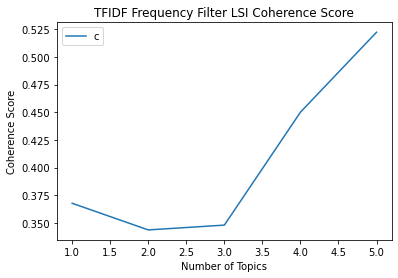

In [31]:
# Create coherence plot for LSI model
x = range(min_topics, max_topics, step)
plt.plot(x, coherence_values_ff)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score")
plt.legend(("coherence_values"), loc="best")
plt.title('TFIDF Frequency Filter LSI Coherence Score')
plt.show()

When using the frequency filter method to remove words that appear less than 5 times and also exclude the top 10% most frequently used words; the best topic is 2 when using the LSI model. 

#### LSI Frequency Filter Data Input

In [32]:
# Use the tokened words and convert them into an array data type
tfidf_ff_tokens_array = np.array(tokens_ff, dtype=object)

In [33]:
# Reshape the tokens list in the array to 3-Dimensional. This needs to be done for the doc2bow
tfidf_ff_3d = []
for i, row in enumerate(tfidf_ff_tokens_array):
    tok_arr = np.array(row)

    converted_arr = []
    for x in tok_arr:
        tok_arr.reshape((len(tok_arr),1,1))
        converted_arr.append(tok_arr)
    tfidf_ff_3d.append(converted_arr)

tfidf_df['ff_3d_tokens'] = tfidf_ff_3d
tfidf_df.head(2)

,category,text,new_text,normal_3d_tokens,top5_normal_lsi_topics,top5_normal_lda_topics,ff_3d_tokens
0,tech,tv future in the hands of viewers with home th...,tv future hand viewer home theatre system plas...,"[[tv, future, hand, viewer, home, theatre, sys...","[(0, -0.441*""tv"" + -0.206*""people"" + -0.206*""w...","[(0, 0.004*""programming"" + 0.004*""promote"" + 0...","[[tv, future, hand, viewer, home, theatre, sys..."
1,business,worldcom boss left books alone former worldc...,worldcom bos left book alone former worldcom b...,"[[worldcom, bos, left, book, alone, former, wo...","[(0, -0.526*""mr"" + -0.351*""worldcom"" + -0.307*...","[(0, 0.008*""never"" + 0.008*""mr"" + 0.008*""order...","[[worldcom, bos, left, book, alone, former, wo..."


In [34]:
# Creating an LSI Model and extracting the top 5 topics for each row 
top_topics = []
for i, row in tfidf_df.iterrows():
    row_list = row['ff_3d_tokens']
    row_dictionary = Dictionary(row_list)
    row_dtm = [row_dictionary.doc2bow(doc) for doc in row_list]

    for this, that in enumerate([row_dtm]):
        row_model = LsiModel(corpus=that, id2word=row_dictionary, num_topics=5)
        top_topics.append(row_model.print_topics(num_topics=5, num_words=5))

tfidf_df['top5_ff_lsi_topics'] = top_topics
tfidf_df.head(2)

,category,text,new_text,normal_3d_tokens,top5_normal_lsi_topics,top5_normal_lda_topics,ff_3d_tokens,top5_ff_lsi_topics
0,tech,tv future in the hands of viewers with home th...,tv future hand viewer home theatre system plas...,"[[tv, future, hand, viewer, home, theatre, sys...","[(0, -0.441*""tv"" + -0.206*""people"" + -0.206*""w...","[(0, 0.004*""programming"" + 0.004*""promote"" + 0...","[[tv, future, hand, viewer, home, theatre, sys...","[(0, -0.441*""tv"" + -0.206*""want"" + -0.206*""peo..."
1,business,worldcom boss left books alone former worldc...,worldcom bos left book alone former worldcom b...,"[[worldcom, bos, left, book, alone, former, wo...","[(0, -0.526*""mr"" + -0.351*""worldcom"" + -0.307*...","[(0, 0.008*""never"" + 0.008*""mr"" + 0.008*""order...","[[worldcom, bos, left, book, alone, former, wo...","[(0, -0.526*""mr"" + -0.351*""worldcom"" + -0.307*..."


### LDA Model - TFIDF Frequency Filter

In [35]:
# Building the corpus and the LDA Model
lda_model_ff = LdaModel(tfidf_ff, num_topics=5, id2word=tfidf_ff_dictionary, passes=5)
lda_model_ff.print_topics(num_topics=5, num_words=5)

[(0,
  '0.007*"party" + 0.006*"tax" + 0.006*"labour" + 0.006*"tory" + 0.006*"blair"'),
 (1, '0.002*"film" + 0.002*"u" + 0.002*"mobile" + 0.002*"mr" + 0.002*"game"'),
 (2,
  '0.008*"virus" + 0.005*"mail" + 0.005*"linux" + 0.004*"spam" + 0.004*"program"'),
 (3,
  '0.004*"wale" + 0.004*"woodward" + 0.003*"dallaglio" + 0.003*"ireland" + 0.003*"rugby"'),
 (4,
  '0.004*"fiat" + 0.003*"beer" + 0.003*"boerse" + 0.003*"lse" + 0.003*"brewery"')]

In [36]:
# Get the coherence score of the main model
lda_model_ff_coh = CoherenceModel(model=lda_model_ff, corpus=tfidf_ff_dtm, dictionary=tfidf_ff_dictionary, coherence='u_mass')
lda_model_ff_coh.get_coherence()

-8.944971531203148

#### Experimenting with different LDA models

In [37]:
# Building a good LDA model for comparison 

ff_good_lda_model = LdaModel(corpus=tfidf_ff_dtm, id2word=tfidf_ff_dictionary, iterations=50, num_topics=5)
ff_good_cm = CoherenceModel(model=ff_good_lda_model, corpus=tfidf_ff_dtm, dictionary=tfidf_ff_dictionary, coherence='u_mass')

ff_good_cm.get_coherence()

-1.3245672783669762

In [38]:
# Building a bad LDA model for comparison

ff_bad_lda_model = LdaModel(corpus=tfidf_ff_dtm, id2word=tfidf_ff_dictionary, iterations=1, num_topics=5)
ff_bad_cm = CoherenceModel(model=ff_good_lda_model, corpus=tfidf_ff_dtm, dictionary=tfidf_ff_dictionary, coherence='u_mass')

ff_bad_cm.get_coherence()

-1.3245672783669762

In [39]:
# VIsualize the topics of the LDA model using the main model

vis_ff = gensimvis.prepare(lda_model_ff, tfidf_ff, tfidf_ff_dictionary)
pyLDAvis.display(vis_ff)

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only


#### LDA Frequency Filter Data Input

In [40]:
# Creating an LSI Model and extracting the top 5 topics for each row 
top_topics = []
for i, row in tfidf_df.iterrows():
    row_list = row['ff_3d_tokens']
    row_dictionary = Dictionary(row_list)
    row_dtm = [row_dictionary.doc2bow(doc) for doc in row_list]

    for this, that in enumerate([row_dtm]):
        row_tfidf_vect = TfidfModel(that)
        row_lda = row_tfidf_vect[that]
        row_model = LdaModel(row_lda, num_topics=5, id2word=row_dictionary, passes=5)
        top_topics.append(row_model.print_topics(num_topics=5, num_words=5))

tfidf_df['top5_ff_lda_topics'] = top_topics
tfidf_df.head(2)

divide by zero encountered in double_scalars
invalid value encountered in double_scalars


,category,text,new_text,normal_3d_tokens,top5_normal_lsi_topics,top5_normal_lda_topics,ff_3d_tokens,top5_ff_lsi_topics,top5_ff_lda_topics
0,tech,tv future in the hands of viewers with home th...,tv future hand viewer home theatre system plas...,"[[tv, future, hand, viewer, home, theatre, sys...","[(0, -0.441*""tv"" + -0.206*""people"" + -0.206*""w...","[(0, 0.004*""programming"" + 0.004*""promote"" + 0...","[[tv, future, hand, viewer, home, theatre, sys...","[(0, -0.441*""tv"" + -0.206*""want"" + -0.206*""peo...","[(0, 0.004*""programming"" + 0.004*""promote"" + 0..."
1,business,worldcom boss left books alone former worldc...,worldcom bos left book alone former worldcom b...,"[[worldcom, bos, left, book, alone, former, wo...","[(0, -0.526*""mr"" + -0.351*""worldcom"" + -0.307*...","[(0, 0.008*""never"" + 0.008*""mr"" + 0.008*""order...","[[worldcom, bos, left, book, alone, former, wo...","[(0, -0.526*""mr"" + -0.351*""worldcom"" + -0.307*...","[(0, 0.008*""never"" + 0.008*""mr"" + 0.008*""order..."


## TFIDF W/ Nouns

### Preprocessing

In [41]:
# Using spacy to get the NOUNS and PRONOUNS from the tokens
tfidf_nn_tokens = []                                                    

for index, row in tfidf_df.iterrows():                                  
    doc = nlp(row["new_text"])
    tokens = [token.text for token in doc if token.pos_ in ['NOUN', 'PROPN']]
    tfidf_nn_tokens.append(tokens)

In [42]:
tfidf_nn_tokens

[['tv',
  'hand',
  'viewer',
  'home',
  'theatre',
  'system',
  'definition',
  'tv',
  'video',
  'recorder',
  'living',
  'room',
  'way',
  'people',
  'tv',
  'year',
  'time',
  'expert',
  'panel',
  'consumer',
  'electronics',
  'show',
  'la',
  'vega',
  'discus',
  'technology',
  'impact',
  'pastime',
  'u',
  'trend',
  'programme',
  'content',
  'viewer',
  'home',
  'network',
  'cable',
  'satellite',
  'telecom',
  'company',
  'broadband',
  'service',
  'provider',
  'room',
  'device',
  'technology',
  'ce',
  'digital',
  'video',
  'recorder',
  'dvr',
  'pvr',
  'box',
  'u',
  'uk',
  'sky',
  'system',
  'people',
  'record',
  'store',
  'pause',
  'wind',
  'tv',
  'programme',
  'technology',
  'tv',
  'definition',
  'tv',
  'business',
  'japan',
  'u',
  'europe',
  'definition',
  'programming',
  'people',
  'wind',
  'advert',
  'network',
  'channel',
  'schedule',
  'la',
  'carte',
  'entertainment',
  'u',
  'network',
  'cable',
  'satellit

In [43]:
# Create a dictionary from the tokens
tfidf_nn_dictionary = Dictionary(tfidf_nn_tokens)
print(tfidf_nn_dictionary)
print('Dictionary Length: ', len(tfidf_nn_dictionary))

Dictionary<17606 unique tokens: ['adam', 'advert', 'advertising', 'bbc', 'bill']...>
Dictionary Length:  17606


In [44]:
# Create corpus
tfidf_nn_dtm = [tfidf_nn_dictionary.doc2bow(doc) for doc in tfidf_nn_tokens]

# Create tfidf model
tfidf_vectorizer_nn = TfidfModel(tfidf_nn_dtm)
tfidf_nn = tfidf_vectorizer_nn[tfidf_nn_dtm]

### LSI Model - TFIDF Nouns Only

In [45]:
# Building the LSI Model

tfidf_normal_lsi_model = LsiModel(corpus = tfidf_nn_dtm, id2word=tfidf_nn_dictionary, num_topics=5)
tfidf_normal_lsi_model.print_topics(num_topics=5, num_words = 5)

[(0,
  '0.425*"mr" + 0.315*"year" + 0.280*"people" + 0.165*"government" + 0.161*"time"'),
 (1,
  '0.496*"mr" + -0.276*"game" + -0.246*"year" + -0.245*"music" + 0.212*"labour"'),
 (2,
  '-0.630*"game" + 0.401*"music" + 0.328*"song" + 0.166*"year" + 0.162*"award"'),
 (3,
  '0.253*"game" + -0.251*"people" + 0.249*"song" + -0.228*"phone" + 0.204*"year"'),
 (4,
  '-0.393*"music" + 0.301*"year" + 0.260*"u" + -0.220*"game" + -0.205*"people"')]

In [46]:
# Determining optimum number of topics using coherence values 

coherence_values_nn = []
lsi_model_list_nn = []
min_topics, max_topics, step = 1, 6, 1
for i in range(min_topics, max_topics, step):
    lsi_model = LsiModel(tfidf_nn_dtm, id2word=tfidf_nn_dictionary, num_topics=i)
    lsi_model_list_nn.append(lsi_model)
    coherencemodel = CoherenceModel(model=lsi_model, texts=tfidf_nn_tokens, dictionary=tfidf_nn_dictionary, coherence='c_v')
    coherence_values_nn.append(coherencemodel.get_coherence())

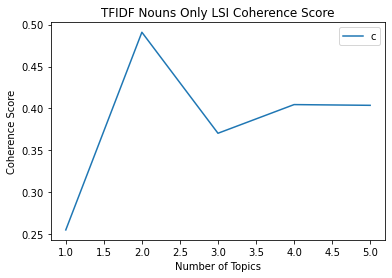

In [47]:
# Create coherence plot for LSI model
x = range(min_topics, max_topics, step)
plt.plot(x, coherence_values_nn)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score")
plt.legend(("coherence_values"), loc="best")
plt.title('TFIDF Nouns Only LSI Coherence Score')
plt.show()

When filtering out the text to only Nouns, the best topic is 4 when we use the LSI model. 

#### LSI Nouns Only Data Input

In [48]:
# Use the tokened words and convert them into an array data type
tfidf_nn_tokens_array = np.array(tfidf_nn_tokens, dtype=object)

In [49]:
# Reshape the tokens list in the array to 3-Dimensional. This needs to be done for the doc2bow
tfidf_nn_3d = []
for i, row in enumerate(tfidf_nn_tokens_array):
    tok_arr = np.array(row)

    converted_arr = []
    for x in tok_arr:
        tok_arr.reshape((len(tok_arr),1,1))
        converted_arr.append(tok_arr)
    tfidf_nn_3d.append(converted_arr)

tfidf_df['nn_3d_tokens'] = tfidf_nn_3d
tfidf_df.head(2)

,category,text,new_text,normal_3d_tokens,top5_normal_lsi_topics,top5_normal_lda_topics,ff_3d_tokens,top5_ff_lsi_topics,top5_ff_lda_topics,nn_3d_tokens
0,tech,tv future in the hands of viewers with home th...,tv future hand viewer home theatre system plas...,"[[tv, future, hand, viewer, home, theatre, sys...","[(0, -0.441*""tv"" + -0.206*""people"" + -0.206*""w...","[(0, 0.004*""programming"" + 0.004*""promote"" + 0...","[[tv, future, hand, viewer, home, theatre, sys...","[(0, -0.441*""tv"" + -0.206*""want"" + -0.206*""peo...","[(0, 0.004*""programming"" + 0.004*""promote"" + 0...","[[tv, hand, viewer, home, theatre, system, def..."
1,business,worldcom boss left books alone former worldc...,worldcom bos left book alone former worldcom b...,"[[worldcom, bos, left, book, alone, former, wo...","[(0, -0.526*""mr"" + -0.351*""worldcom"" + -0.307*...","[(0, 0.008*""never"" + 0.008*""mr"" + 0.008*""order...","[[worldcom, bos, left, book, alone, former, wo...","[(0, -0.526*""mr"" + -0.351*""worldcom"" + -0.307*...","[(0, 0.008*""never"" + 0.008*""mr"" + 0.008*""order...","[[worldcom, bos, book, worldcom, bos, bernie, ..."


In [50]:
# Creating an LSI Model and extracting the top 5 topics for each row 
top_topics = []
for i, row in tfidf_df.iterrows():
    row_list = row['nn_3d_tokens']
    row_dictionary = Dictionary(row_list)
    row_dtm = [row_dictionary.doc2bow(doc) for doc in row_list]

    for this, that in enumerate([row_dtm]):
        row_model = LsiModel(corpus=that, id2word=row_dictionary, num_topics=5)
        top_topics.append(row_model.print_topics(num_topics=5, num_words=5))

tfidf_df['top5_nn_lsi_topics'] = top_topics
tfidf_df.head(2)

,category,text,new_text,normal_3d_tokens,top5_normal_lsi_topics,top5_normal_lda_topics,ff_3d_tokens,top5_ff_lsi_topics,top5_ff_lda_topics,nn_3d_tokens,top5_nn_lsi_topics
0,tech,tv future in the hands of viewers with home th...,tv future hand viewer home theatre system plas...,"[[tv, future, hand, viewer, home, theatre, sys...","[(0, -0.441*""tv"" + -0.206*""people"" + -0.206*""w...","[(0, 0.004*""programming"" + 0.004*""promote"" + 0...","[[tv, future, hand, viewer, home, theatre, sys...","[(0, -0.441*""tv"" + -0.206*""want"" + -0.206*""peo...","[(0, 0.004*""programming"" + 0.004*""promote"" + 0...","[[tv, hand, viewer, home, theatre, system, def...","[(0, -0.526*""tv"" + -0.245*""people"" + -0.210*""b..."
1,business,worldcom boss left books alone former worldc...,worldcom bos left book alone former worldcom b...,"[[worldcom, bos, left, book, alone, former, wo...","[(0, -0.526*""mr"" + -0.351*""worldcom"" + -0.307*...","[(0, 0.008*""never"" + 0.008*""mr"" + 0.008*""order...","[[worldcom, bos, left, book, alone, former, wo...","[(0, -0.526*""mr"" + -0.351*""worldcom"" + -0.307*...","[(0, 0.008*""never"" + 0.008*""mr"" + 0.008*""order...","[[worldcom, bos, book, worldcom, bos, bernie, ...","[(0, -0.581*""mr"" + -0.387*""worldcom"" + -0.339*..."


### LDA Model - TFIDF Nouns Only

In [51]:
# Building LDA Model
lda_model_nn = LdaModel(tfidf_nn, num_topics=5, id2word=tfidf_nn_dictionary, passes=5)
lda_model_nn.print_topics(num_topics=5, num_words=5)

[(0,
  '0.003*"mr" + 0.003*"film" + 0.003*"blair" + 0.002*"phone" + 0.002*"election"'),
 (1,
  '0.003*"holmes" + 0.002*"ferguson" + 0.002*"cup" + 0.001*"match" + 0.001*"game"'),
 (2,
  '0.001*"stern" + 0.001*"boogeyman" + 0.001*"tate" + 0.001*"herlihy" + 0.001*"aragones"'),
 (3,
  '0.002*"mobile" + 0.001*"music" + 0.001*"uwb" + 0.001*"band" + 0.001*"robot"'),
 (4,
  '0.002*"dollar" + 0.002*"u" + 0.002*"economy" + 0.002*"bank" + 0.002*"growth"')]

In [52]:
# Get Coherence score of the main model
lda_model_nn_coh = CoherenceModel(model=lda_model_nn, corpus=tfidf_nn_dtm, dictionary=tfidf_nn_dictionary, coherence='u_mass')
lda_model_nn_coh.get_coherence()

-9.36493121430292

#### Experimenting with different LDA models

In [53]:
# Building a good Lda Model for comparison
nn_good_lda_model = LdaModel(corpus=tfidf_nn_dtm, id2word=tfidf_nn_dictionary, iterations=50, num_topics=5)
nn_good_cm = CoherenceModel(model=nn_good_lda_model, corpus=tfidf_nn_dtm, dictionary=tfidf_nn_dictionary, coherence='u_mass')

nn_good_cm.get_coherence()

-2.015443636506225

In [54]:
# Building a bad Lda Model for comparison
nn_bad_lda_model = LdaModel(corpus=tfidf_nn_dtm, id2word=tfidf_nn_dictionary, iterations=1, num_topics=5)
nn_bad_cm = CoherenceModel(model=nn_good_lda_model, corpus=tfidf_nn_dtm, dictionary=tfidf_nn_dictionary, coherence='u_mass')

nn_bad_cm.get_coherence()

-2.015443636506225

In [55]:
# Create an interactive graph to visualize the top 5 topics using the main model
vis_nn = gensimvis.prepare(lda_model_nn, tfidf_nn, tfidf_nn_dictionary)
pyLDAvis.display(vis_nn)

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only


#### LDA Nouns Only Data Input

In [56]:
# Creating an LSI Model and extracting the top 5 topics for each row 
top_topics = []
for i, row in tfidf_df.iterrows():
    row_list = row['nn_3d_tokens']
    row_dictionary = Dictionary(row_list)
    row_dtm = [row_dictionary.doc2bow(doc) for doc in row_list]

    for this, that in enumerate([row_dtm]):
        row_tfidf_vect = TfidfModel(that)
        row_lda = row_tfidf_vect[that]
        row_model = LdaModel(row_lda, num_topics=5, id2word=row_dictionary, passes=5)
        top_topics.append(row_model.print_topics(num_topics=5, num_words=5))

tfidf_df['top5_nn_lda_topics'] = top_topics
tfidf_df.head(2)

divide by zero encountered in double_scalars
invalid value encountered in double_scalars


,category,text,new_text,normal_3d_tokens,top5_normal_lsi_topics,top5_normal_lda_topics,ff_3d_tokens,top5_ff_lsi_topics,top5_ff_lda_topics,nn_3d_tokens,top5_nn_lsi_topics,top5_nn_lda_topics
0,tech,tv future in the hands of viewers with home th...,tv future hand viewer home theatre system plas...,"[[tv, future, hand, viewer, home, theatre, sys...","[(0, -0.441*""tv"" + -0.206*""people"" + -0.206*""w...","[(0, 0.004*""programming"" + 0.004*""promote"" + 0...","[[tv, future, hand, viewer, home, theatre, sys...","[(0, -0.441*""tv"" + -0.206*""want"" + -0.206*""peo...","[(0, 0.004*""programming"" + 0.004*""promote"" + 0...","[[tv, hand, viewer, home, theatre, system, def...","[(0, -0.526*""tv"" + -0.245*""people"" + -0.210*""b...","[(0, 0.007*""programme"" + 0.007*""president"" + 0..."
1,business,worldcom boss left books alone former worldc...,worldcom bos left book alone former worldcom b...,"[[worldcom, bos, left, book, alone, former, wo...","[(0, -0.526*""mr"" + -0.351*""worldcom"" + -0.307*...","[(0, 0.008*""never"" + 0.008*""mr"" + 0.008*""order...","[[worldcom, bos, left, book, alone, former, wo...","[(0, -0.526*""mr"" + -0.351*""worldcom"" + -0.307*...","[(0, 0.008*""never"" + 0.008*""mr"" + 0.008*""order...","[[worldcom, bos, book, worldcom, bos, bernie, ...","[(0, -0.581*""mr"" + -0.387*""worldcom"" + -0.339*...","[(0, 0.016*""pe"" + 0.016*""phone"" + 0.016*""paint..."


## Export to CSV

### Pre-Export Data Cleanup

In [57]:
tfidf_df.columns

Index(['category', 'text', 'new_text', 'normal_3d_tokens',
       'top5_normal_lsi_topics', 'top5_normal_lda_topics', 'ff_3d_tokens',
       'top5_ff_lsi_topics', 'top5_ff_lda_topics', 'nn_3d_tokens',
       'top5_nn_lsi_topics', 'top5_nn_lda_topics'],
      dtype='object')

In [58]:
# Drop token columns as they are not needed
tfidf_df = tfidf_df.drop(['normal_3d_tokens', 'ff_3d_tokens', 'nn_3d_tokens'], axis = 1)
tfidf_df.columns

Index(['category', 'text', 'new_text', 'top5_normal_lsi_topics',
       'top5_normal_lda_topics', 'top5_ff_lsi_topics', 'top5_ff_lda_topics',
       'top5_nn_lsi_topics', 'top5_nn_lda_topics'],
      dtype='object')

In [59]:
# View Final Dataset
tfidf_df.head(10)

,category,text,new_text,top5_normal_lsi_topics,top5_normal_lda_topics,top5_ff_lsi_topics,top5_ff_lda_topics,top5_nn_lsi_topics,top5_nn_lda_topics
0,tech,tv future in the hands of viewers with home th...,tv future hand viewer home theatre system plas...,"[(0, -0.441*""tv"" + -0.206*""people"" + -0.206*""w...","[(0, 0.004*""programming"" + 0.004*""promote"" + 0...","[(0, -0.441*""tv"" + -0.206*""want"" + -0.206*""peo...","[(0, 0.004*""programming"" + 0.004*""promote"" + 0...","[(0, -0.526*""tv"" + -0.245*""people"" + -0.210*""b...","[(0, 0.007*""programme"" + 0.007*""president"" + 0..."
1,business,worldcom boss left books alone former worldc...,worldcom bos left book alone former worldcom b...,"[(0, -0.526*""mr"" + -0.351*""worldcom"" + -0.307*...","[(0, 0.008*""never"" + 0.008*""mr"" + 0.008*""order...","[(0, -0.526*""mr"" + -0.351*""worldcom"" + -0.307*...","[(0, 0.008*""never"" + 0.008*""mr"" + 0.008*""order...","[(0, -0.581*""mr"" + -0.387*""worldcom"" + -0.339*...","[(0, 0.016*""pe"" + 0.016*""phone"" + 0.016*""paint..."
2,sport,tigers wary of farrell gamble leicester say ...,tiger wary farrell gamble leicester say rushed...,"[(0, -0.341*""farrell"" + -0.205*""leicester"" + -...","[(0, 0.010*""replacement"" + 0.010*""row"" + 0.010...","[(0, -0.341*""farrell"" + -0.205*""leicester"" + -...","[(0, 0.010*""replacement"" + 0.010*""row"" + 0.010...","[(0, -0.464*""farrell"" + -0.279*""union"" + -0.27...","[(0, 0.020*""process"" + 0.020*""problem"" + 0.020..."
3,sport,yeading face newcastle in fa cup premiership s...,yeading face newcastle fa cup premiership side...,"[(0, -0.229*""league"" + -0.229*""side"" + -0.184*...","[(0, 0.006*""portsmouth"" + 0.006*""played"" + 0.0...","[(0, -0.229*""league"" + -0.229*""side"" + -0.184*...","[(0, 0.006*""portsmouth"" + 0.006*""played"" + 0.0...","[(0, -0.261*""league"" + -0.261*""side"" + -0.209*...","[(0, 0.008*""preston"" + 0.008*""premier"" + 0.008..."
4,entertainment,ocean s twelve raids box office ocean s twelve...,ocean twelve raid box office ocean twelve crim...,"[(0, -0.307*""sequel"" + -0.307*""ocean"" + -0.184...","[(0, 0.007*""release"" + 0.007*""rat"" + 0.007*""re...","[(0, -0.307*""sequel"" + -0.307*""ocean"" + -0.184...","[(0, 0.007*""release"" + 0.007*""rat"" + 0.007*""re...","[(0, -0.373*""ocean"" + -0.373*""sequel"" + -0.224...","[(0, 0.011*""release"" + 0.011*""reunites"" + 0.01..."
5,politics,howard hits back at mongrel jibe michael howar...,howard hit back mongrel jibe michael howard sa...,"[(0, -0.425*""howard"" + -0.394*""mr"" + -0.243*""s...","[(0, 0.005*""politics"" + 0.005*""policy"" + 0.005...","[(0, -0.425*""howard"" + -0.394*""mr"" + -0.243*""s...","[(0, 0.005*""politics"" + 0.005*""policy"" + 0.005...","[(0, -0.495*""howard"" + -0.459*""mr"" + -0.247*""p...","[(0, 0.008*""policy"" + 0.008*""plan"" + 0.008*""po..."
6,politics,blair prepares to name poll date tony blair is...,blair prepares name poll date tony blair likel...,"[(0, -0.354*""election"" + -0.295*""blair"" + -0.2...","[(0, 0.009*""prime"" + 0.009*""push"" + 0.009*""pol...","[(0, -0.354*""election"" + -0.295*""government"" +...","[(0, 0.009*""prime"" + 0.009*""push"" + 0.009*""pol...","[(0, -0.408*""election"" + -0.340*""parliament"" +...","[(0, 0.018*""plan"" + 0.018*""push"" + 0.018*""parl..."
7,sport,henman hopes ended in dubai third seed tim hen...,henman hope ended dubai third seed tim henman ...,"[(0, -0.467*""henman"" + -0.234*""seed"" + -0.234*...","[(0, 0.012*""rain"" + 0.012*""raining"" + 0.012*""p...","[(0, -0.467*""henman"" + -0.234*""seed"" + -0.234*...","[(0, 0.012*""rain"" + 0.012*""raining"" + 0.012*""p...","[(0, -0.580*""henman"" + -0.290*""seed"" + -0.290*...","[(0, 0.026*""progress"" + 0.026*""place"" + 0.026*..."
8,sport,wilkinson fit to face edinburgh england captai...,wilkinson fit face edinburgh england captain j...,"[(0, -0.331*""wilkinson"" + -0.248*""england"" + -...","[(0, 0.012*""return"" + 0.012*""right"" + 0.012*""p...","[(0, -0.331*""wilkinson"" + -0.248*""injury"" + -0.